# Metrics tutorial

In [1]:
# All the necessary imports
%matplotlib inline
import matplotlib.pyplot as plt

import sys
import numpy as np

sys.path.insert(0, '..')
from seismiqb import SeismicGeometry, Horizon, GeometryMetrics, HorizonMetrics, plot

# Load everything

First of all, we create instances of geometry, horizon, and metrics:

In [2]:
geometry = SeismicGeometry('/data/seismic/CUBE_15/15_cube.hdf5')
gmetrics = GeometryMetrics(geometry)

print(geometry)


Geometry for cube              /data/seismic/CUBE_15/15_cube.hdf5
Current index:                 ['INLINE_3D', 'CROSSLINE_3D']
Shape:                         [2010 1520 1751]
Time delay and sample rate:    0, 2.0

Cube size:                     60.6 GB
Size of the instance:          0.849 GB

Number of traces:              3055200
Number of non-zero traces:     2213067

Num of unique amplitudes:      219
Mean/std of amplitudes:        0.45563/3333.45
Min/max amplitudes:            -54577.2/52478.1
q01/q99 amplitudes:            -9655.96/10075.8



In [3]:
horizon = Horizon('/data/seismic/CUBE_15/RAW/J4', geometry)
horizon.filter()
hmetrics = HorizonMetrics(horizon)

print(horizon)


Horizon J4 for 15_cube.hdf5 loaded from file
Ilines range:      13 to 1980
Xlines range:      24 to 1516
Depth range:       1031 to 1114
Depth mean:        1078.73
Depth std:         13.1044

Length:            2165963
Perimeter:         8139
Coverage:          0.97872
Solidity:          0.99009
Num of holes:      105



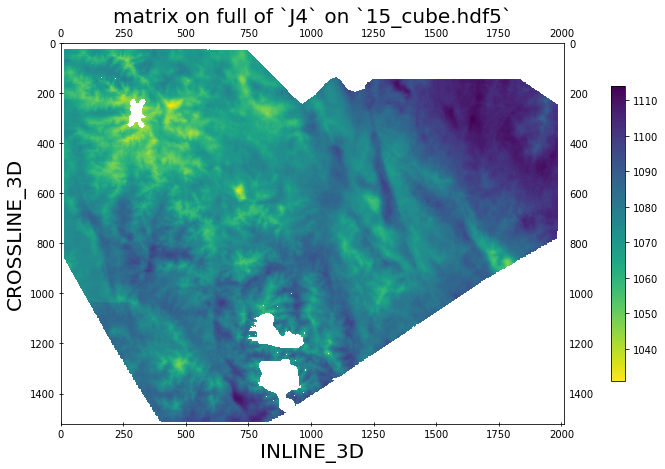

In [4]:
horizon.show()

Looking at the depth map does not provide a lot of insight on quality of the horizon; let's see whether we can spot some flaws on inline/crossline slices:

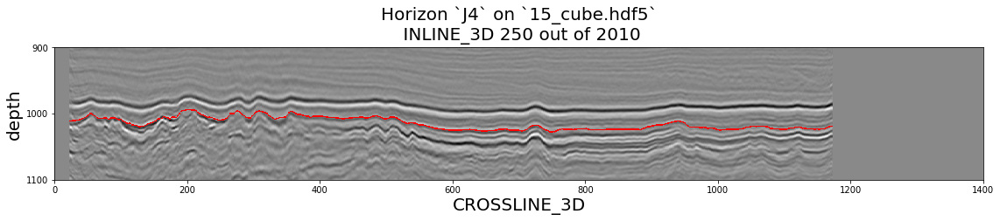

In [5]:
horizon.show_slide(250, axis='i', figsize=(19, 14),
                   zoom=(slice(None), slice(900, 1200)))

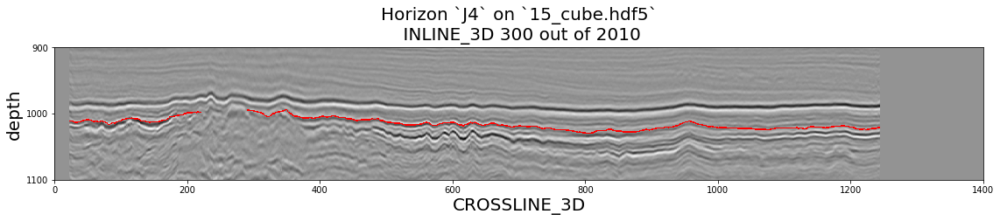

In [6]:
horizon.show_slide(300, axis='i', figsize=(19, 14),
                   zoom=(slice(None), slice(900, 1200)))

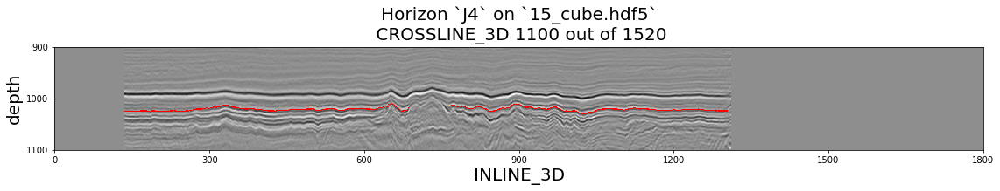

In [7]:
horizon.show_slide(1100, axis='x', figsize=(19, 14),
                   zoom=(slice(None), slice(900, 1200)))

We can easly spot change of the tracked phase on iline slices; it is hard to tell the scale of these flaws, though.

# Initial assessment

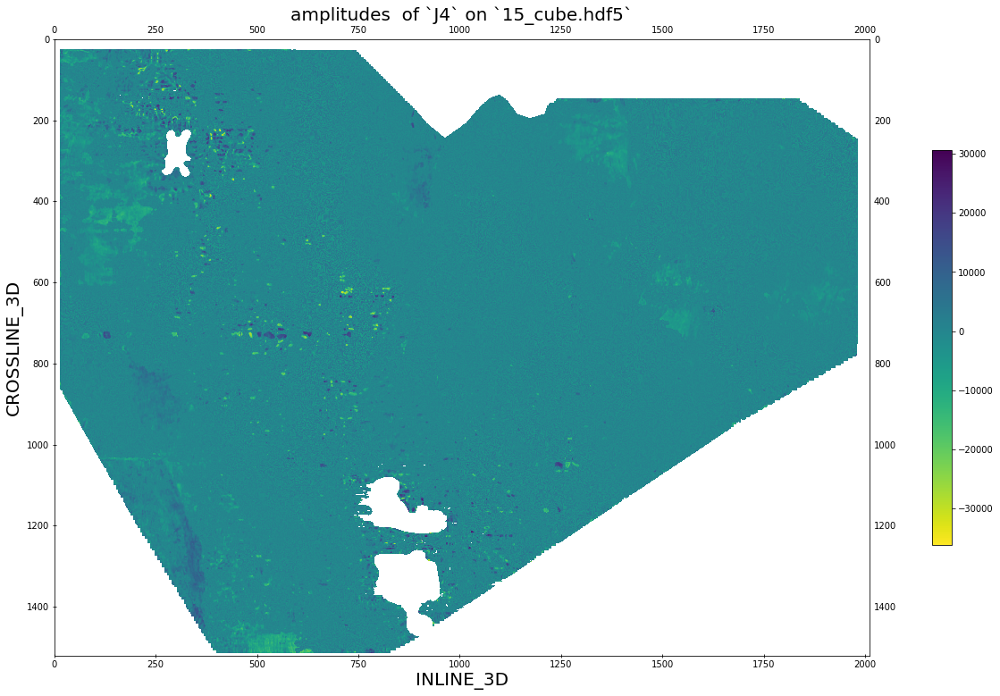

In [8]:
horizon.show('amplitudes', on_full=False, figsize=(18, 18))

/usr/local/lib/python3.6/dist-packages/numpy/lib/histograms.py:839: RuntimeWarning:

invalid value encountered in greater_equal

/usr/local/lib/python3.6/dist-packages/numpy/lib/histograms.py:840: RuntimeWarning:

invalid value encountered in less_equal



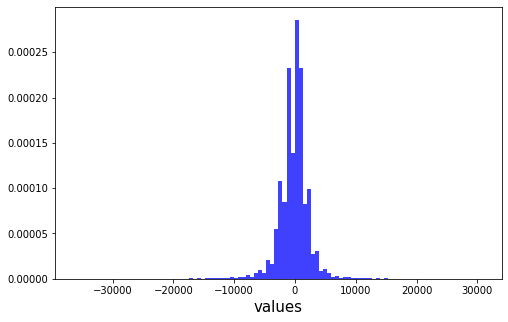

In [9]:
plot(horizon.amplitudes, mode='histogram', bins=100)

One of the better geological attribute is phase along the horizon: it helps us to locate major flaws in the labeled horizon.

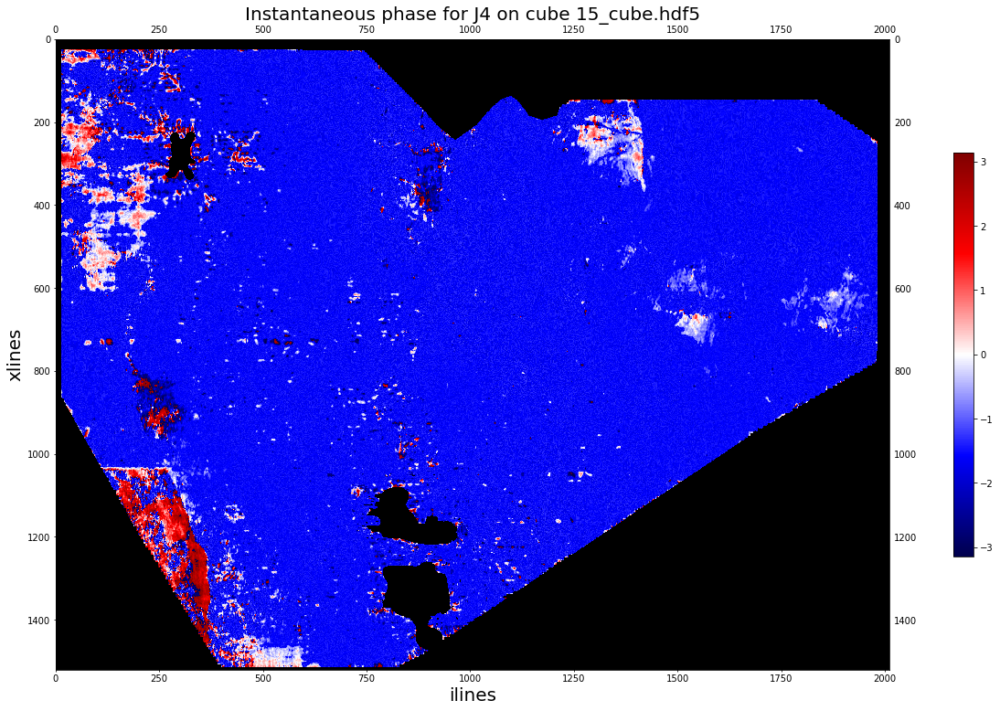

In [10]:
i_phase = hmetrics.evaluate('instantaneous_phase', plot=True, figsize=(18, 18), cmap='seismic')

1% and 99% quantiles: [-2.57662317  2.30929196]


/usr/local/lib/python3.6/dist-packages/numpy/lib/histograms.py:839: RuntimeWarning:

invalid value encountered in greater_equal

/usr/local/lib/python3.6/dist-packages/numpy/lib/histograms.py:840: RuntimeWarning:

invalid value encountered in less_equal



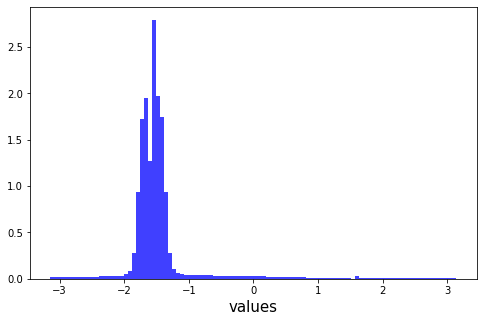

In [11]:
print(f'1% and 99% quantiles: {np.nanquantile(i_phase, [0.01, 0.99])}')
plot(i_phase, mode='histogram', bins=100)

# Local metrics

A better approach to horizon evaluation is as follows:

- cut amplitudes along the horizon surface in some fixed window (in our framework default is 33)
- for each trace in the produced 3D array, compare it against neighbours in the square area `k` $\times$ `k` with fixed function `f`
- reduce obtained $k^2 - 1$ values via `reduce_func`

For example, the next cell computes a well-known [coherence map](https://library.seg.org/doi/10.1190/1.1437077):

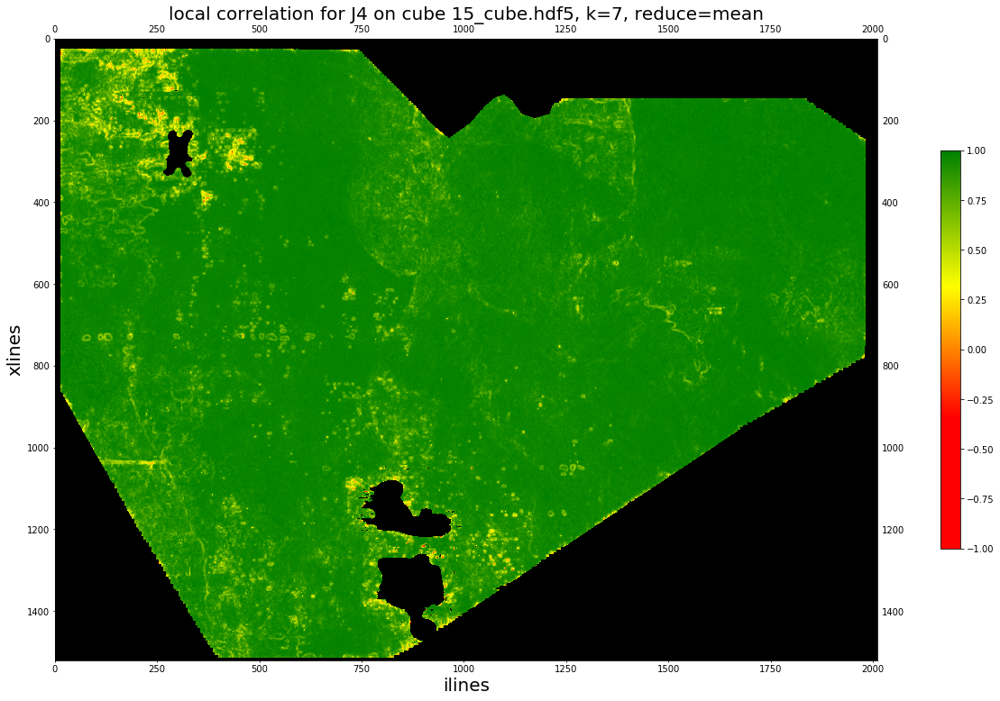

In [12]:
l_corrs = hmetrics.evaluate('local_corrs', kernel_size=7, reduce_func='mean',
                            plot=True, figsize=(18, 18))

1% and 99% quantiles: [0.54255652 0.99218024]


/usr/local/lib/python3.6/dist-packages/numpy/lib/histograms.py:839: RuntimeWarning:

invalid value encountered in greater_equal

/usr/local/lib/python3.6/dist-packages/numpy/lib/histograms.py:840: RuntimeWarning:

invalid value encountered in less_equal



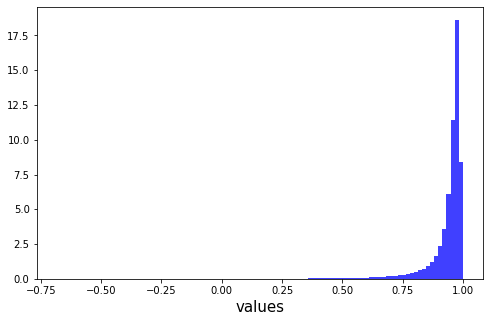

In [13]:
print(f'1% and 99% quantiles: {np.nanquantile(l_corrs, [0.01, 0.99])}')
plot(l_corrs, mode='histogram', bins=100)

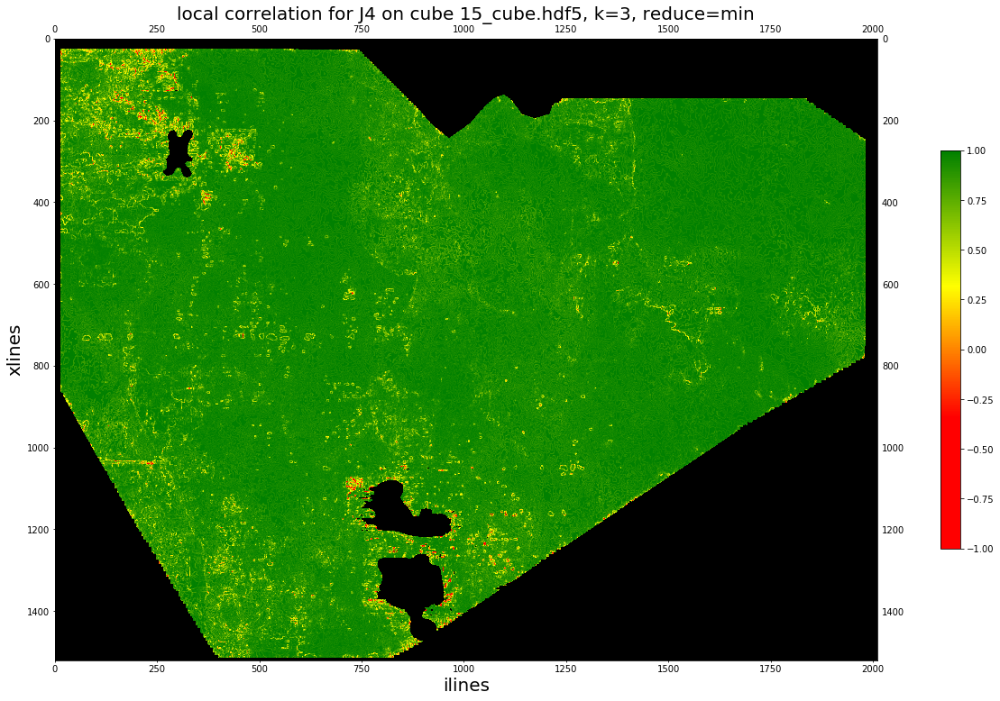

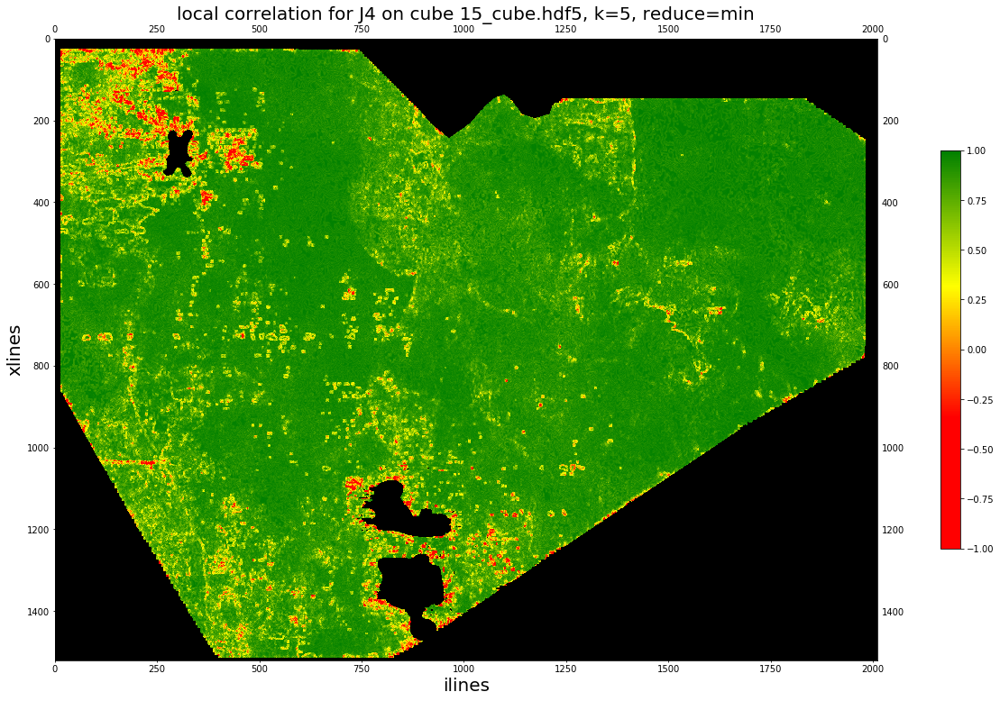

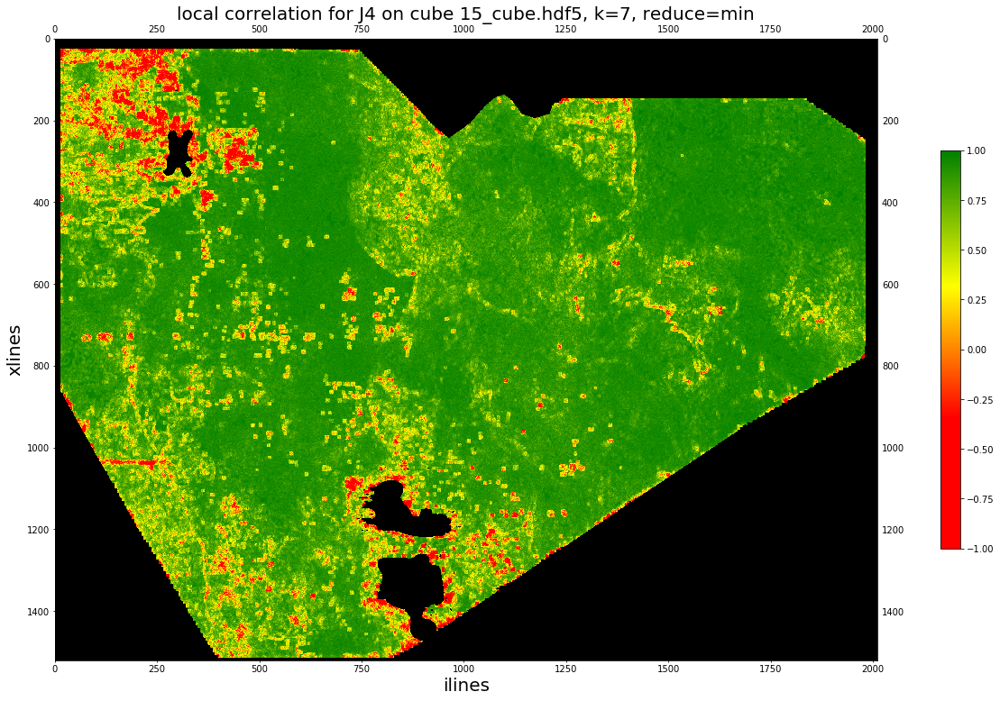

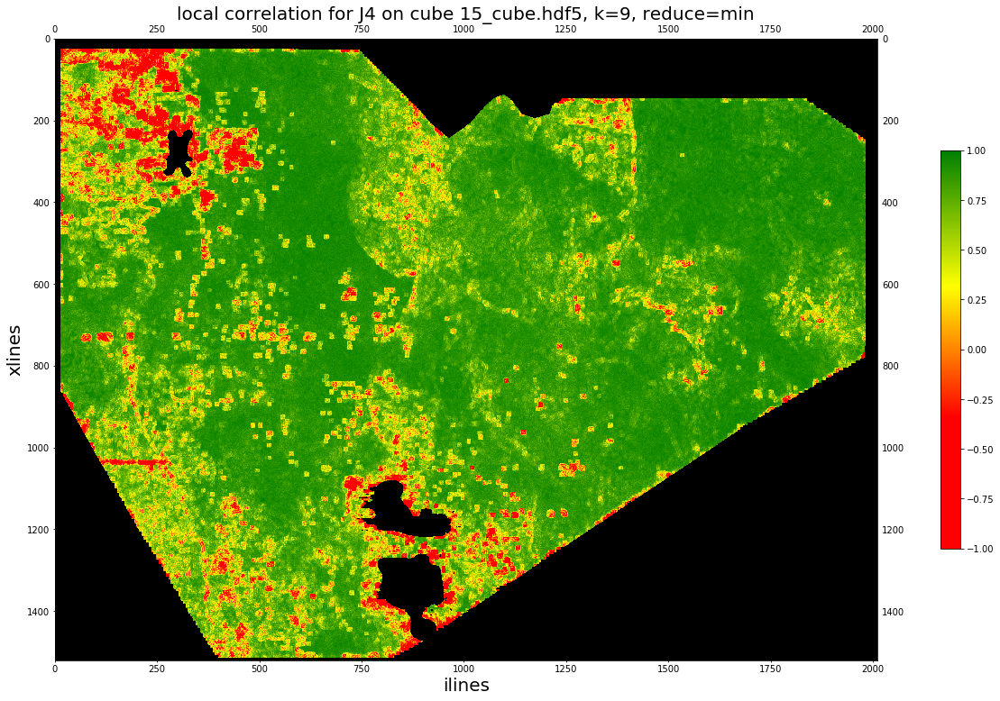

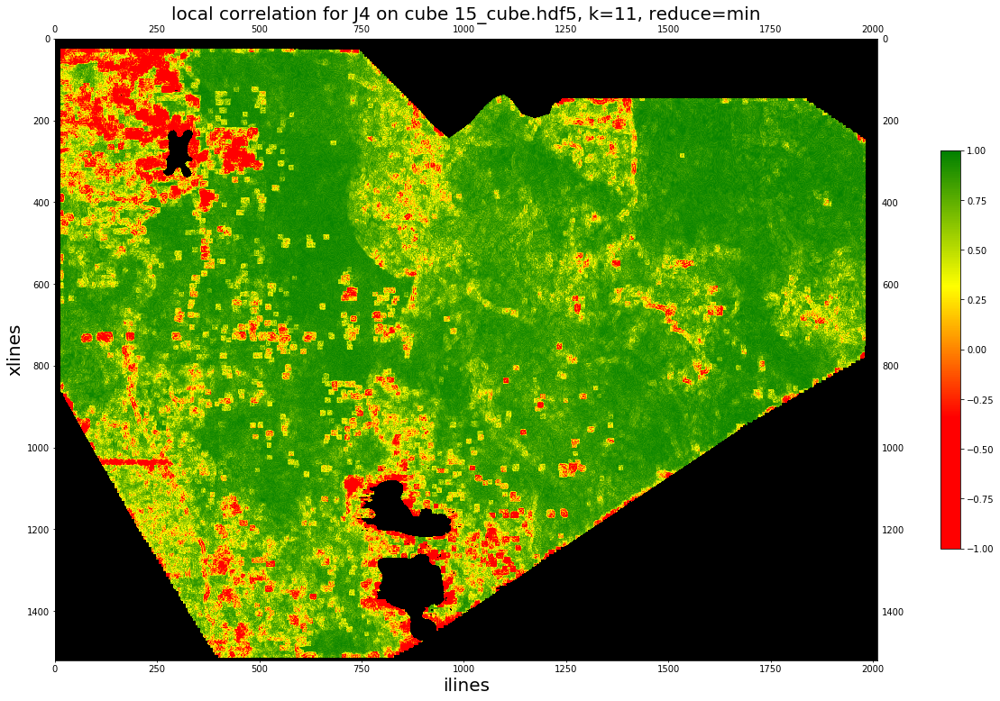

In [14]:
for k in [3, 5, 7, 9, 11]:
    _ = hmetrics.evaluate('local_corrs', kernel_size=k, reduce_func='min',
                          plot=True, figsize=(18, 18))
    plt.show()

# Support metrics

The problem with metrics, evaluated in `local` fashion, is their inability to take into account any distant changes. That is a huge problem: as the seismic changes rather slowly along any of the directions, a slow decrease in horizon quality remains unnoticed by any of the `coherence`-like attributes. An example can be seen in the lower left region, where all of the previous maps fail to capture change in phases.

To overcome this effect, we propose following procedure:

- as before, cut amplitudes along the horizon surface in some fixed window
- randomly choose `N` reference traces
- compare every other trace in the cut volume against all the reference traces
- reduce obtained $N$ numbers into one to get the statistic for each labeled spatial point


../seismiqb/src/metrics.py:1099: RuntimeWarning:

invalid value encountered in true_divide



CPU times: user 47.4 s, sys: 22.4 s, total: 1min 9s
Wall time: 1min 9s


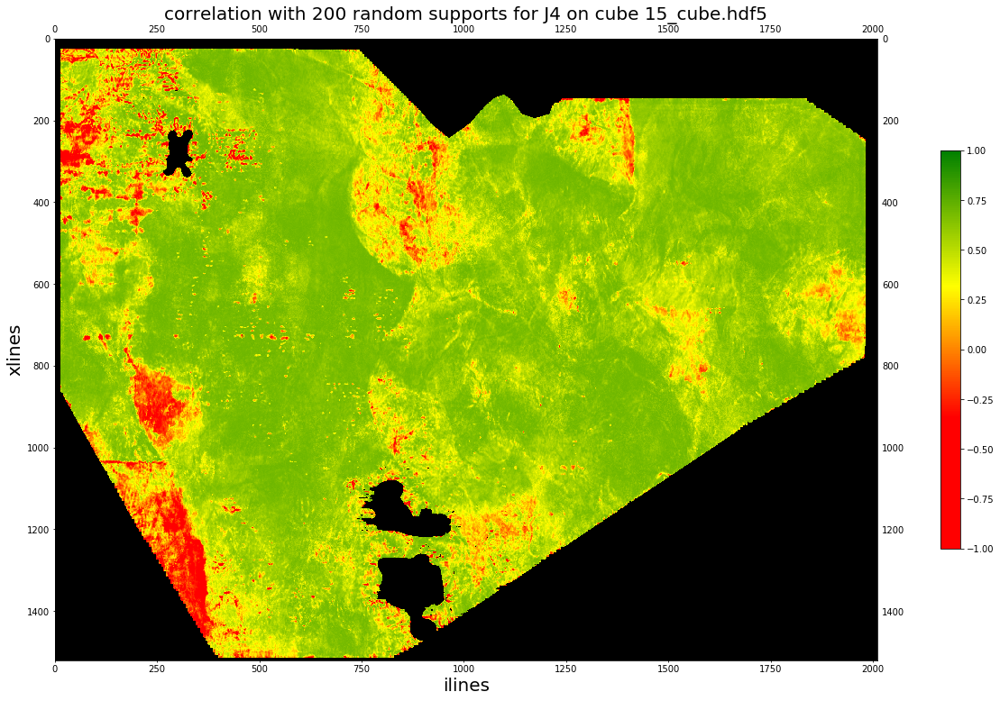

In [15]:
%%time
s_corrs = hmetrics.evaluate('support_corrs', agg='mean', supports=200,
                            plot=True, figsize=(18, 18))

1% and 99% quantiles: [-0.33463263  0.69751302]


/usr/local/lib/python3.6/dist-packages/numpy/lib/histograms.py:839: RuntimeWarning:

invalid value encountered in greater_equal

/usr/local/lib/python3.6/dist-packages/numpy/lib/histograms.py:840: RuntimeWarning:

invalid value encountered in less_equal



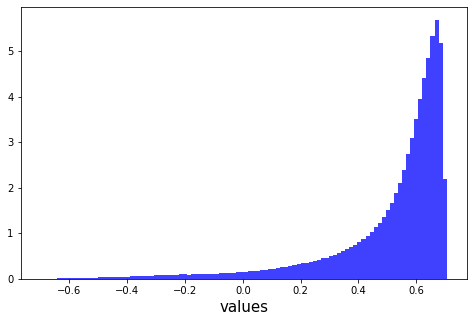

In [16]:
print(f'1% and 99% quantiles: {np.nanquantile(s_corrs, [0.01, 0.99])}')
plot(s_corrs, mode='histogram', bins=100)

/usr/local/lib/python3.6/dist-packages/numpy/lib/histograms.py:839: RuntimeWarning:

invalid value encountered in greater_equal

/usr/local/lib/python3.6/dist-packages/numpy/lib/histograms.py:840: RuntimeWarning:

invalid value encountered in less_equal



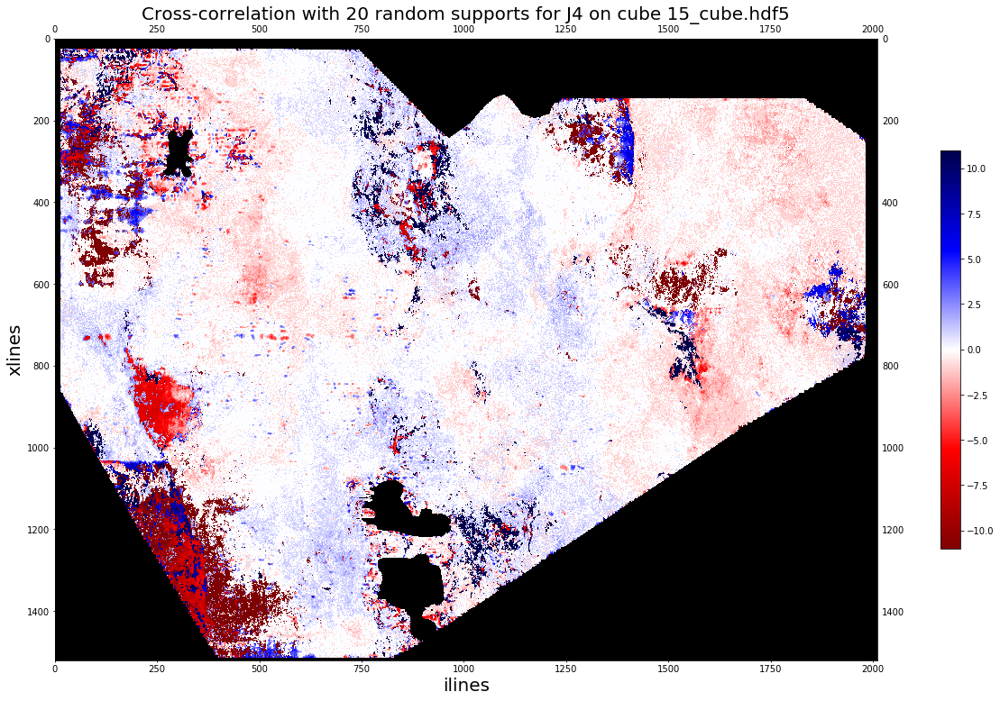

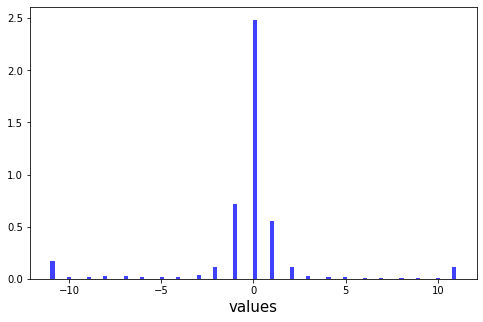

CPU times: user 1min 52s, sys: 50.9 s, total: 2min 43s
Wall time: 2min 43s


In [17]:
%%time
s_crosscorrs = hmetrics.evaluate('support_crosscorrs', agg='mode', supports=20,
                                 plot=True, figsize=(18, 18))

plot(s_crosscorrs, mode='histogram', bins=100)

# Cube metrics

By using a simple trick we can extend our efforts to find anomalies in the seismic data itself:

- instead of using the amplitudes along the horizon, we convert each trace into histogram with fixed bins
- after that, we can apply the same methods in either `local` or `support` fashion
- since each trace in the new array is a distribution, it is better to use distances between probability distributions to analyze

../seismiqb/src/metrics.py:123: RuntimeWarning:

Mean of empty slice



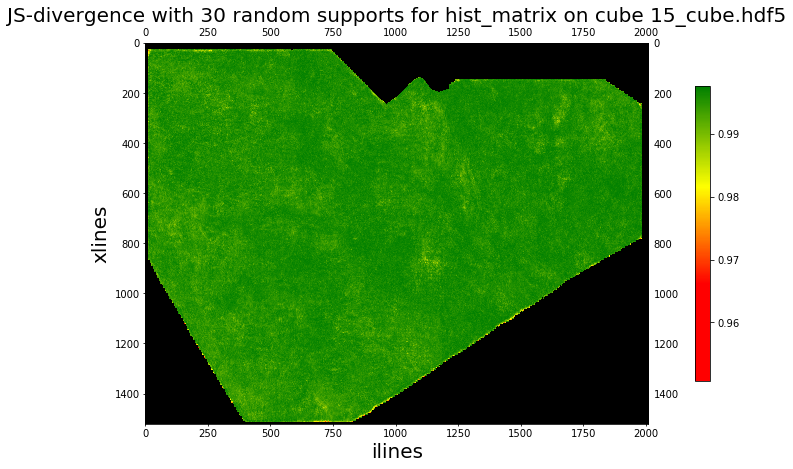

In [18]:
_ = gmetrics.evaluate('support_js', supports=30, plot=True)

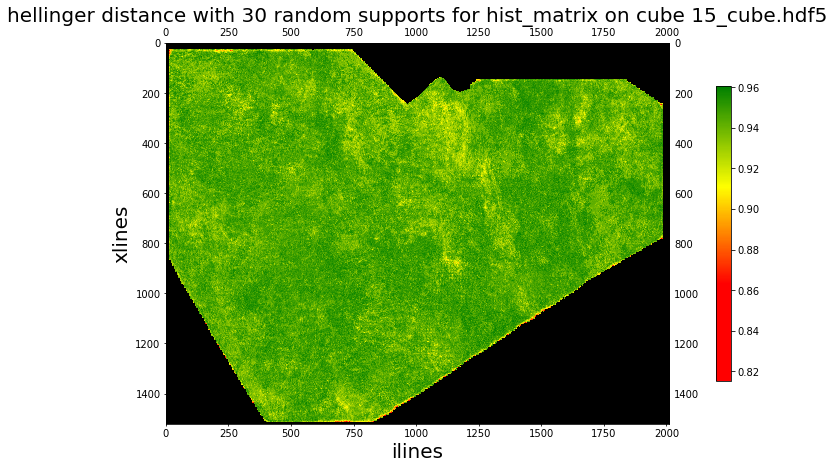

In [19]:
_ = gmetrics.evaluate('support_hellinger', supports=30, plot=True)